<a href="https://colab.research.google.com/github/NguyenDucAnh-2k6/Broadcasting-scheme/blob/main/prac5_LocalFeatureAnd_ImageMatching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from IPython.display import Image
from skimage.feature import hog
import skimage
import matplotlib.pyplot as plt
import os
import cv2
import numpy as np
import imutils

In [2]:
print(cv2.__version__)

4.12.0


In [3]:
def detect_corner(img_path, blockSize=3, ksize=3, k=0.04, threshold=0.1):
  img=cv2.imread(img_path)
  gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  gray=np.float32(gray)
  dst=cv2.cornerHarris(gray, blockSize, ksize, k)
  dst=cv2.dilate(dst, None)
  img[dst>threshold*dst.max()]=[0,255,0]  #Set pixel vals to blue
  rel_path, img_basename=os.path.split(img_path)
  output_file=os.path.join(rel_path, 'corner_'+img_basename)
  cv2.imwrite(output_file, img)
  return output_file


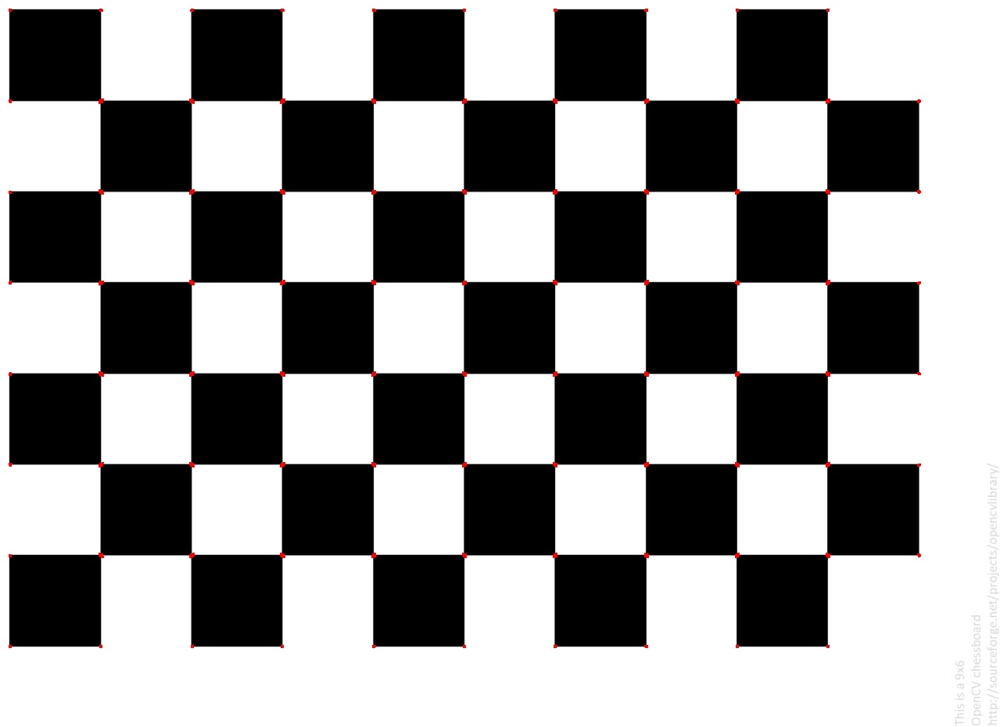

In [4]:
out_path=detect_corner('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/chessboard.jpg')
Image(out_path)

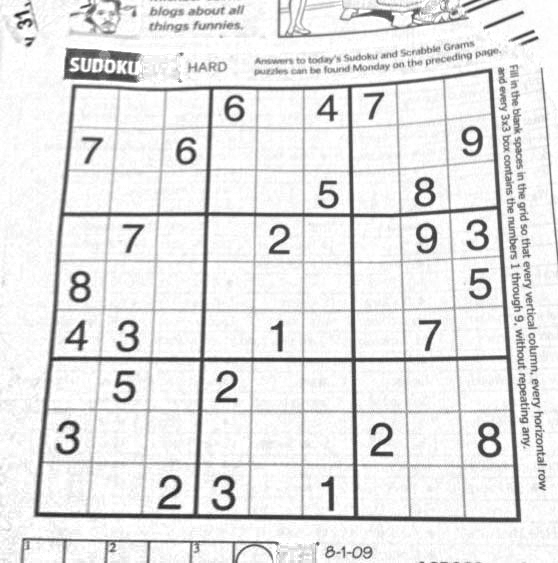

In [5]:
Image('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/sudoku.png')

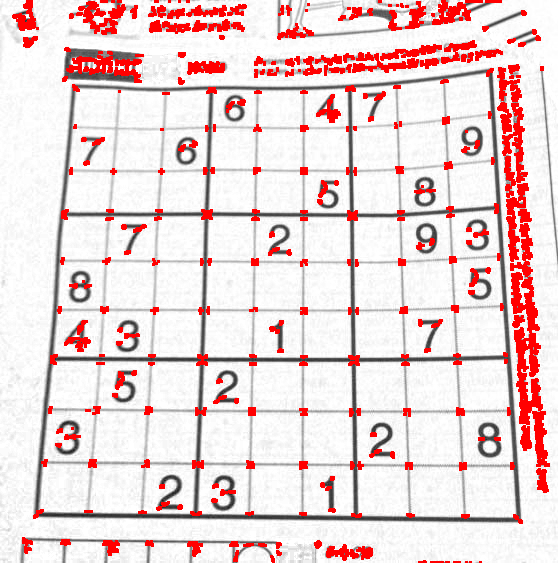

In [6]:
out_path=detect_corner('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/sudoku.png')
Image(out_path)

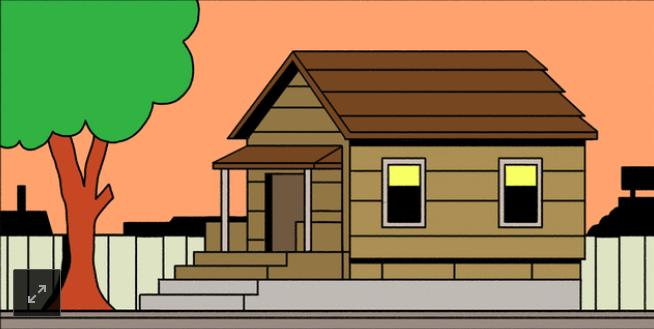

In [7]:
Image('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/house.jpg')

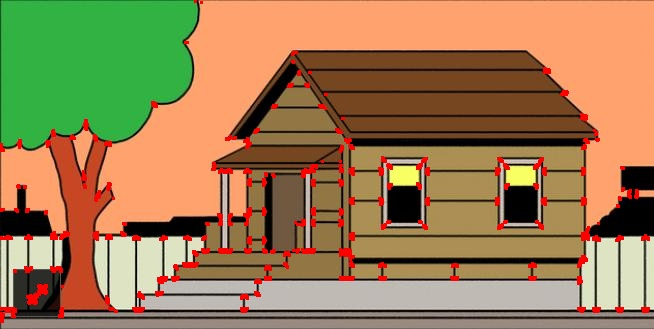

In [8]:
out_path=detect_corner('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/house.jpg')
Image(out_path)

(3696,)
(348, 352, 3)


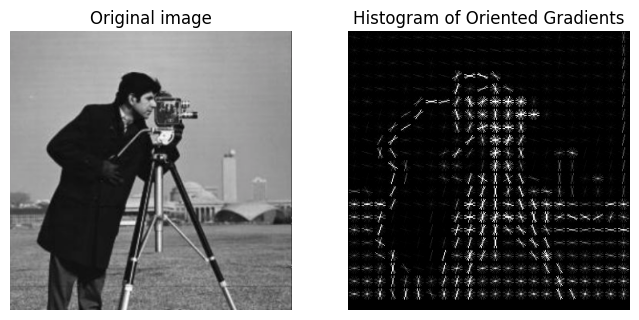

In [9]:
img=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/man.png')
'''fd, hog_image=hog(img, orientations=8, pixels_per_cell=(16,16), cells_per_block=(1,1), visualize=True, channel_axis=2)
print(fd.shape)
print(img.shape)
fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,4), sharex=True, sharey=True)
ax1.axis('off')
ax1.imshow(img, cmap=plt.cm.gray)
ax1.set_title('Original image')
hog_image_rescaled=skimage.exposure.rescale_intensity(hog_image, in_range=(0,10))
ax2.axis('off')
ax2.imshow(hog_image, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show()'''
fd, hog_image=hog(img, orientations=8, pixels_per_cell=(16,16), cells_per_block=(1,1), visualize=True, channel_axis=2)
print(fd.shape)
print(img.shape)
fig, (ax1,ax2)=plt.subplots(1,2, figsize=(8,4), sharex=True, sharey=True)
ax1.axis('off')
ax1.imshow(img, cmap=plt.cm.gray)
ax1.set_title('Original image')
hog_image_rescaled=skimage.exposure.rescale_intensity(hog_image, in_range=(0,10))
ax2.axis('off')
ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
ax2.set_title('Histogram of Oriented Gradients')
plt.show()

**SIFT**

Num of keypoints:  878
(2.876577854156494, 204.2153778076172)
2.3521835803985596
119.755615234375
Descriptor shape:  (878, 128)
Descriptor size:  128


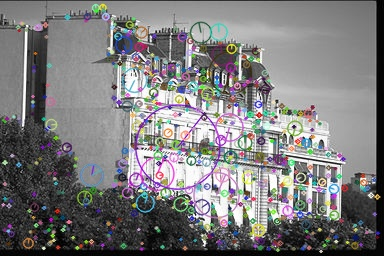

In [10]:
img=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/ville01002.jpg')
gray=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
sift=cv2.SIFT_create()  #sift object
kp, des=sift.detectAndCompute(gray, None)
print('Num of keypoints: ', len(kp))
print(kp[0].pt)
print(kp[0].size)
print(kp[0].angle)
print('Descriptor shape: ', des.shape)
print('Descriptor size: ', sift.descriptorSize())
img=cv2.drawKeypoints(gray, kp, img, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.imwrite('sift_keypoint.jpg', img)
Image('sift_keypoint.jpg')


To use SURF, which is a patented algorithm, you need to install a specific version of `opencv-contrib-python` that includes non-free modules. Let's try installing version 3.4.11.45, which is known to include these.

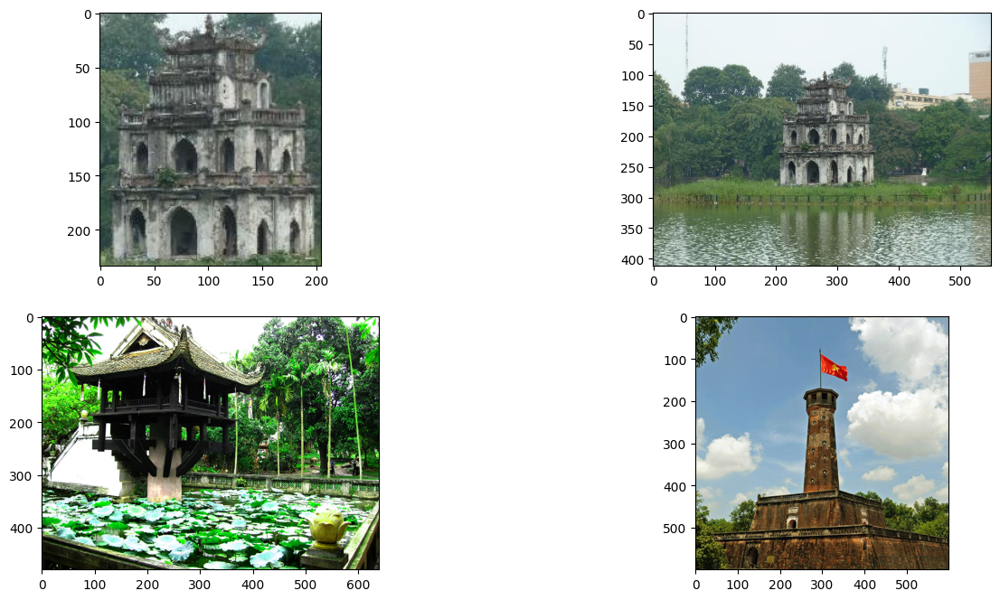

In [11]:
img1=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/thaprua.jpg')
img2=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/thaprua2.jpg')
img3=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/chuamotcot.jpg')
img4=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/cotco.jpg')
img1_=cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2_=cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
img3_=cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)
img4_=cv2.cvtColor(img4, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(16,8))
plt.subplot(2,2,1)
plt.imshow(img1_)
plt.subplot(2,2,2)
plt.imshow(img2_)
plt.subplot(2,2,3)
plt.imshow(img3_)
plt.subplot(2,2,4)
plt.imshow(img4_)
plt.show()

In [12]:
sift=cv2.SIFT_create()
kp1,des1=sift.detectAndCompute(img1, None)
kp2,des2=sift.detectAndCompute(img2, None)
kp3,des3=sift.detectAndCompute(img3, None)
kp4,des4=sift.detectAndCompute(img4, None)

In [13]:
FLANN_INDEX_KDTREE=0
index_params=dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params=dict(checks=50)
flann=cv2.FlannBasedMatcher(index_params, search_params)
matches2=flann.knnMatch(des1, des2, k=2)
MIN_MATCH_COUNT=10
good=[]
distance_ratio=0.7
for m, n in matches2:
  if m.distance<distance_ratio*n.distance:
    good.append(m)

In [36]:
if len(good) > MIN_MATCH_COUNT:
  src_pts=np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
  dst_pts=np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)
  M,masks=cv2.findHomography(src_pts, dst_pts, cv2.RANSAC,5.0)
  matches_mask=masks.ravel().tolist()
  h,w,d=img1.shape
  pts=np.float32([[0,0], [0, h-1], [w-1, h-1], [w-1,0]]).reshape(-1,1,2)
  dst=cv2.perspectiveTransform(pts, M)
  img2=cv2.polylines(img2, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)
else:
  print('No good format is found: {}/{}'.format(len(good), MIN_MATCH_COUNT))
  matches_mask=None

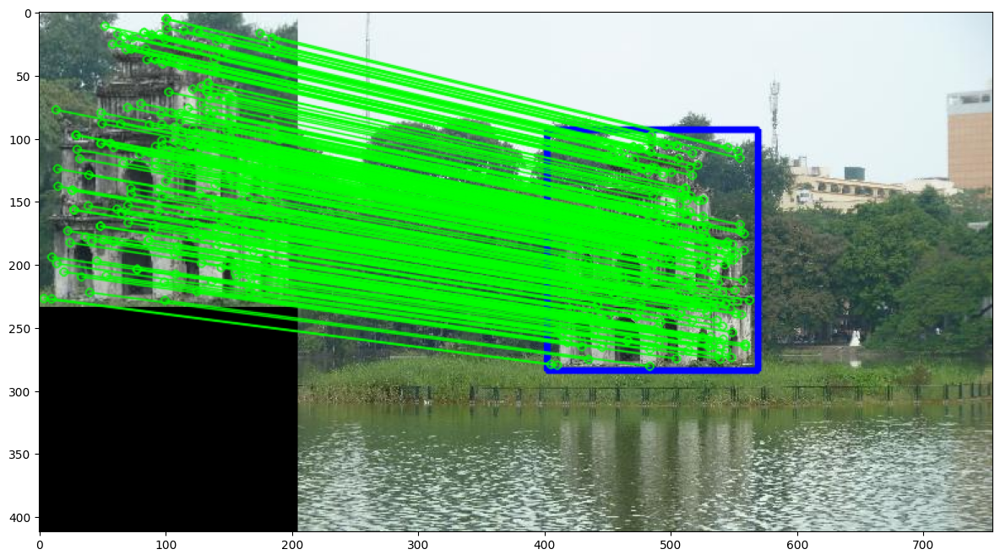

In [15]:
draw_params=dict(matchColor=(0,255,0), singlePointColor=None, matchesMask=matches_mask, flags=2)
img12=cv2.drawMatches(img1, kp1, img2, kp2, good, None, **draw_params)
plt.figure(figsize=(16,8))
plt.imshow(cv2.cvtColor(img12, cv2.COLOR_BGR2RGB))
plt.show()

In [16]:
def image_matching(img1, img2, distance_ratio=0.7, min_match_count=10):
    """
    Match features between two images using SIFT and FLANN, draw matches and projected image1 outline in img2.

    Parameters:
        img1 (np.ndarray): Query image (source).
        img2 (np.ndarray): Train image (destination).
        distance_ratio (float): Lowe's ratio for filtering matches.
        min_match_count (int): Minimum number of good matches to proceed.

    Returns:
        output (np.ndarray): Image with matches drawn. Returns image without homography if not enough matches.
    """
    # Initialize SIFT detector
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)

    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Find two nearest neighbors
    matches = flann.knnMatch(des1, des2, k=2)

    # Apply Lowe's ratio test
    good = []
    for m, n in matches:
        if m.distance < distance_ratio * n.distance:
            good.append(m)

    img2_poly = img2.copy()
    matches_mask = None

    # Proceed to compute homography only if enough matches
    if len(good) >= min_match_count:
        # Extract matched keypoints
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

        # Compute homography
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        matches_mask = mask.ravel().tolist()

        # Draw projected polygon of img1 in img2
        h, w = img1.shape[:2]
        pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)
        dst = cv2.perspectiveTransform(pts, M)
        cv2.polylines(img2_poly, [np.int32(dst)], True, (0, 255, 0), 3, cv2.LINE_AA)
    else:
        print(f"Not enough matches are found - {len(good)}/{min_match_count}")

    # Draw matches
    draw_params = dict(
        matchColor=(0, 255, 0),
        singlePointColor=None,
        matchesMask=matches_mask,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    output = cv2.drawMatches(img1, kp1, img2_poly, kp2, good, None, **draw_params)

    print(f"Number of good matches: {len(good)}")
    return output


Number of good matches: 251


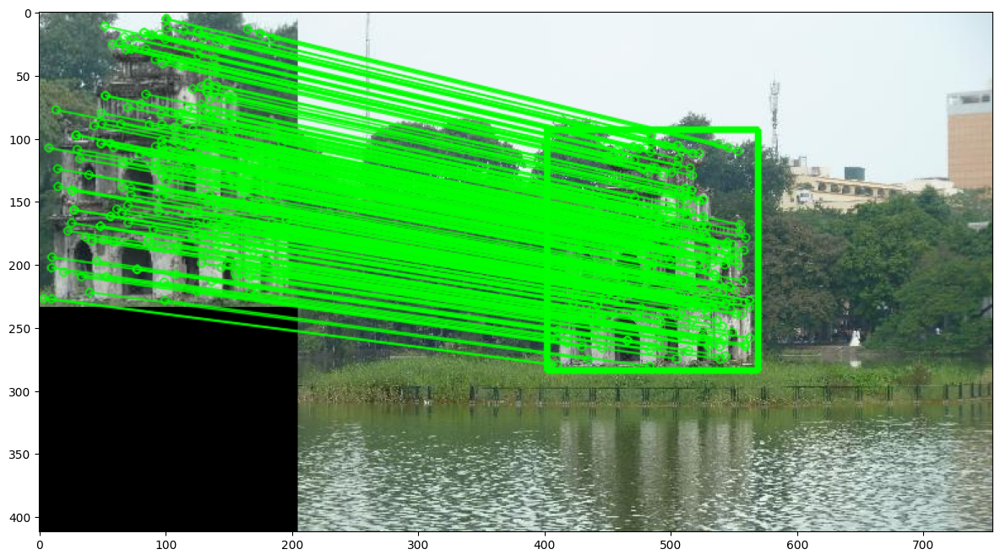

In [17]:
output_img12 = image_matching(img1_, img2_, 0.7)
plt.figure(figsize=(16,8))
plt.imshow(output_img12)
plt.show()

Not enough matches are found - 1/10
Number of good matches: 1


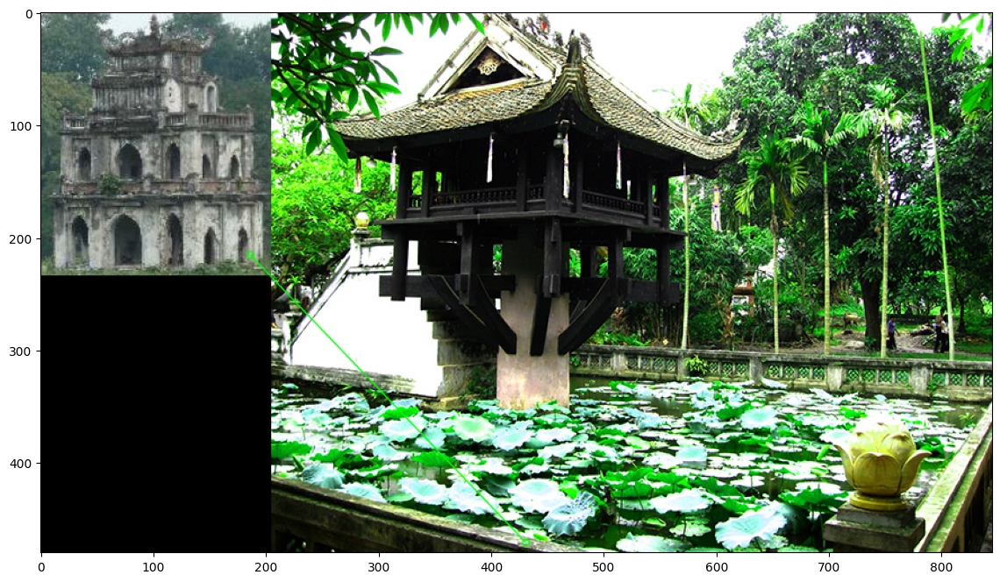

In [18]:
output_img13 = image_matching(img1_, img3_)
plt.figure(figsize=(16,8))
plt.imshow(output_img13)
plt.show()

Not enough matches are found - 2/10
Number of good matches: 2


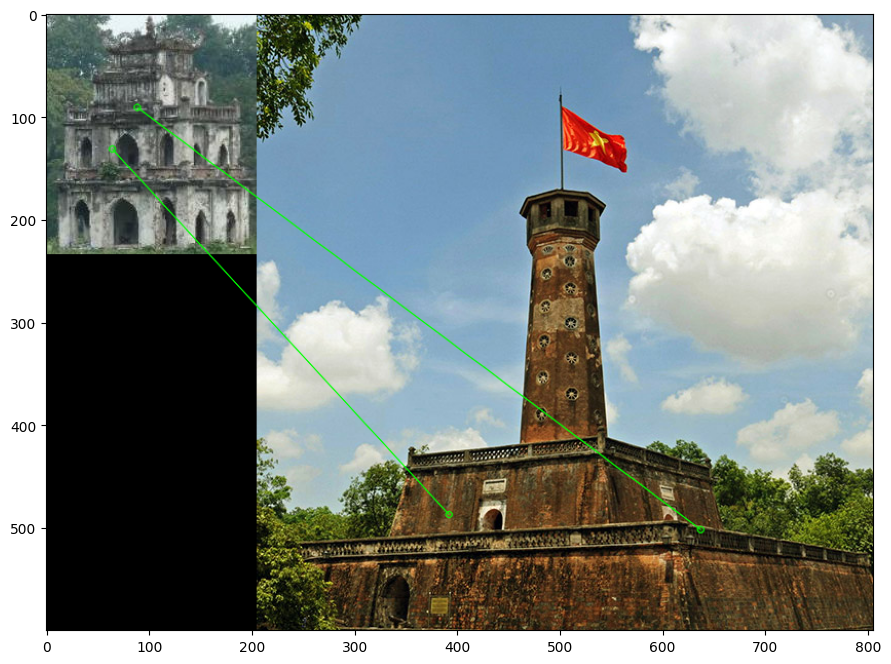

In [19]:
output_img14=image_matching(img1_, img4_)
plt.figure(figsize=(16,8))
plt.imshow(output_img14)
plt.show()

Not enough matches are found - 0/10
Number of good matches: 0


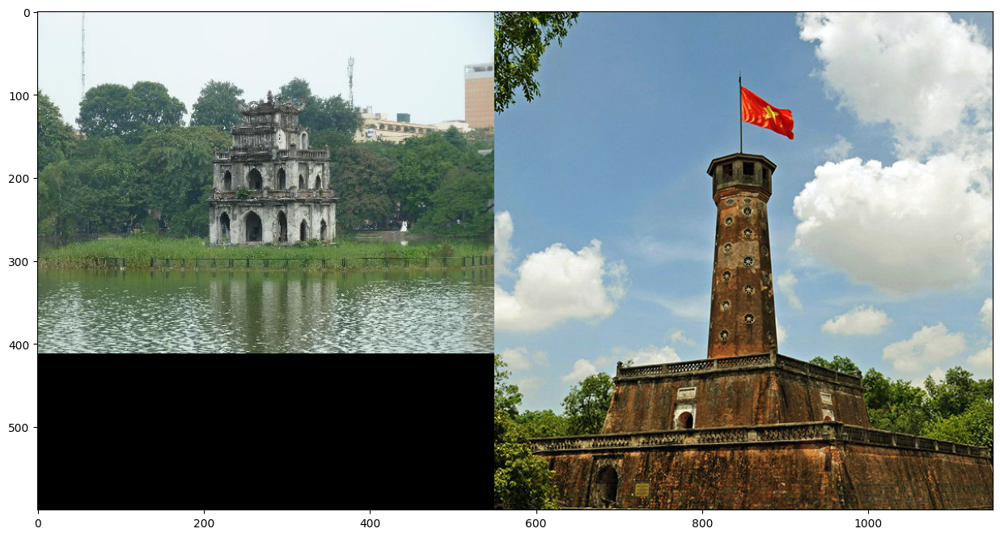

In [20]:
output_img24 = image_matching(img2_, img4_)
plt.figure(figsize=(16,8))
plt.imshow(output_img24)
plt.show()

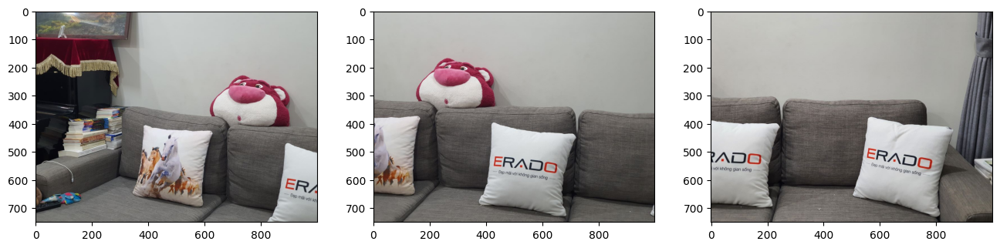

In [21]:
imgA=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/panorama/sofa_left.jpg')
imgB=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/panorama/sofa_middle.jpg')
imgC=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/panorama/sofa_right.jpg')
plt.figure(figsize=(16,8))
plt.subplot(131), plt.imshow(cv2.cvtColor(imgA, cv2.COLOR_BGR2RGB))
plt.subplot(132), plt.imshow(cv2.cvtColor(imgB, cv2.COLOR_BGR2RGB))
plt.subplot(133), plt.imshow(cv2.cvtColor(imgC, cv2.COLOR_BGR2RGB))
plt.show()

Number of good matches: 271


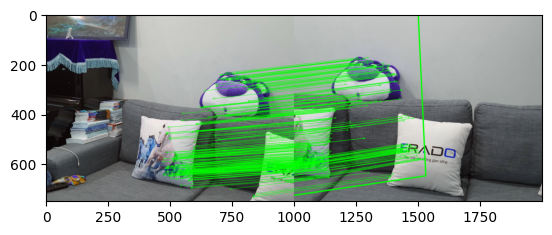

In [22]:
plt.imshow(image_matching(imgA, imgB))
plt.show()

Number of good matches: 22


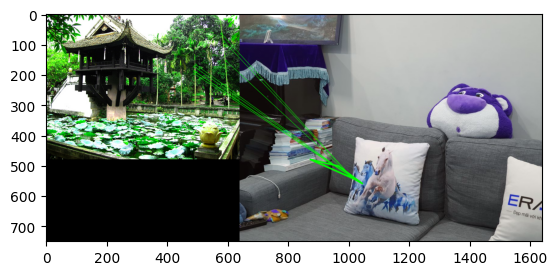

In [23]:
plt.imshow(image_matching(img3_, imgA))
plt.show()

Number of good matches: 21


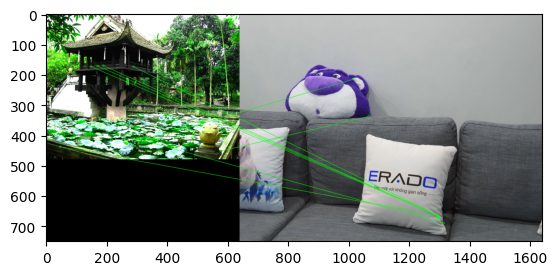

In [24]:
plt.imshow(image_matching(img3_, imgB))
plt.show()

Number of good matches: 21


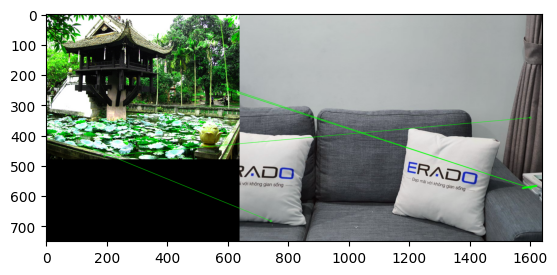

In [25]:
plt.imshow(image_matching(img3_, imgC))
plt.show()

Not enough matches are found - 8/10
Number of good matches: 8


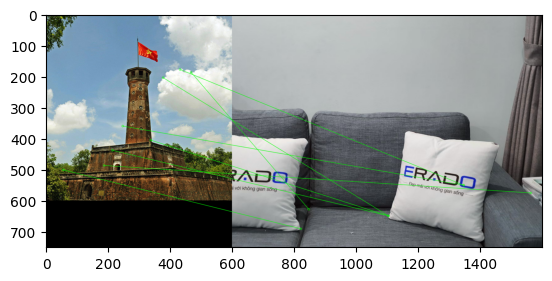

In [26]:
plt.imshow(image_matching(img4_, imgC))
plt.show()

In [27]:
def image_matching_surf(img1, img2, hessian_ratio=400, distance_ratio=0.7, min_match_count=10):
    """
    Match features between two images using SIFT and FLANN, draw matches and projected image1 outline in img2.

    Parameters:
        img1 (np.ndarray): Query image (source).
        img2 (np.ndarray): Train image (destination).
        distance_ratio (float): Lowe's ratio for filtering matches.
        min_match_count (int): Minimum number of good matches to proceed.

    Returns:
        output (np.ndarray): Image with matches drawn. Returns image without homography if not enough matches.
    """
    # Initialize SIFT detector
    try:
      surf=cv2.xfeatures2d.SURF_create(hessian_ratio)
    except AttributeError:
      surf=cv2.SURF_create(hessian_ratio)
    kp1, des1 = surf.detectAndCompute(img1, None)
    kp2, des2 = surf.detectAndCompute(img2, None)

    # FLANN parameters
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # Find two nearest neighbors
    matches = flann.knnMatch(des1, des2, k=2)

    # Apply Lowe's ratio test
    good = []
    for m, n in matches:
        if m.distance < distance_ratio * n.distance:
            good.append(m)

    img2_poly = img2.copy()
    matches_mask = None

    # Proceed to compute homography only if enough matches
    if len(good) >= min_match_count:
        # Extract matched keypoints
        src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

        # Compute homography
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        matches_mask = mask.ravel().tolist()

        # Draw projected polygon of img1 in img2
        h, w = img1.shape[:2]
        pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(-1, 1, 2)
        dst = cv2.perspectiveTransform(pts, M)
        cv2.polylines(img2_poly, [np.int32(dst)], True, (0, 255, 0), 3, cv2.LINE_AA)
    else:
        print(f"Not enough matches are found - {len(good)}/{min_match_count}")

    # Draw matches
    draw_params = dict(
        matchColor=(0, 255, 0),
        singlePointColor=None,
        matchesMask=matches_mask,
        flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
    )
    output = cv2.drawMatches(img1, kp1, img2_poly, kp2, good, None, **draw_params)

    print(f"Number of good matches: {len(good)}")
    return output


In [28]:
image_matching_surf(img1_, img2_)

AttributeError: module 'cv2' has no attribute 'SURF_create'

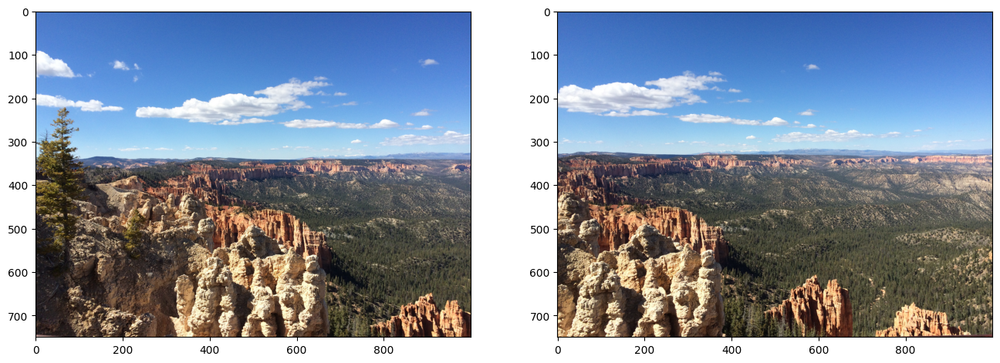

In [29]:
imgA=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/panorama/mountain1_left.png')
imgB=cv2.imread('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/panorama/mountain1_right.png')
plt.figure(figsize=(16,16))
plt.subplot(121), plt.imshow(cv2.cvtColor(imgA, cv2.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(cv2.cvtColor(imgB, cv2.COLOR_BGR2RGB))
plt.show()

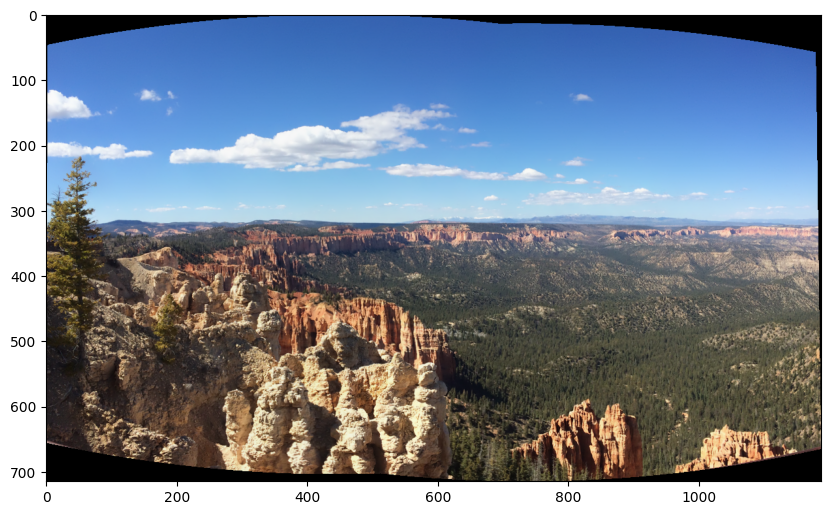

In [30]:
stitcher=cv2.createStitcher() if imutils.is_cv3() else cv2.Stitcher_create()
result=stitcher.stitch((imgA, imgB))
stitched=result[1]
cv2.imwrite('mountain1.png', stitched)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(stitched, cv2.COLOR_BGR2RGB))
plt.show()

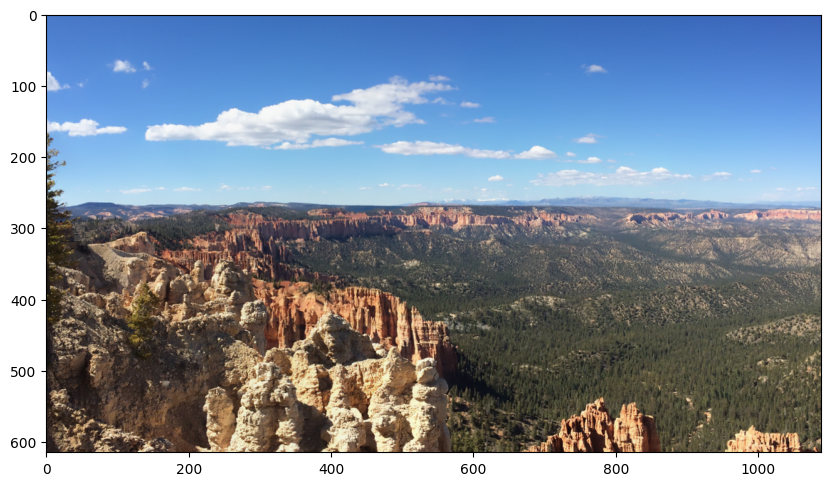

In [31]:
stitched = cv2.copyMakeBorder(stitched, 10, 10, 10, 10, cv2.BORDER_CONSTANT, (0,0,0))
gray=cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
thresh=cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]
cnts=cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts=imutils.grab_contours(cnts)
c=max(cnts, key=cv2.contourArea)
mask=np.zeros(thresh.shape, dtype='uint8')
(x,y,w,h)=cv2.boundingRect(c)
cv2.rectangle(mask, (x,y), (x+w, y+h), 255,-1)
minRect=mask.copy()
sub=mask.copy()
while cv2.countNonZero(sub)>0:
  minRect=cv2.erode(minRect, None)
  sub=cv2.subtract(minRect, thresh)
cnts=cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts=imutils.grab_contours(cnts)
c=max(cnts, key=cv2.contourArea)
(x,y,w,h)=cv2.boundingRect(c)
stitched=stitched[y:y+h, x:x+w]
cv2.imwrite('mountain_stitched.png', stitched)
plt.figure(figsize=(10,10))
plt.imshow(cv2.cvtColor(stitched, cv2.COLOR_BGR2RGB))
plt.show()

In [32]:
def paranoma(img1_path, img2_path):
   img1=cv2.imread(img1_path)
   img2=cv2.imread(img2_path)
   stitcher=cv2.createStitcher() if imutils.is_cv3() else cv2.Stitcher_create()
   result=stitcher.stitch((img1, img2))
   stitched=result[1]
   stitched=cv2.copyMakeBorder(stitched, 10,10,10,10, cv2.BORDER_CONSTANT, (0,0,0))
   gray=cv2.cvtColor(stitched, cv2.COLOR_BGR2GRAY)
   thresh=cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY)[1]
   cnts=cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
   cnts=imutils.grab_contours(cnts)

   if len(cnts) == 0:
       print("No contours found. Returning the raw stitched image.")
       return stitched

   c=max(cnts, key=cv2.contourArea)
   mask=np.zeros(thresh.shape, dtype='uint8')
   (x,y,w,h)=cv2.boundingRect(c)
   cv2.rectangle(mask, (x,y), (x+w, y+h), 255, -1)
   minRect=mask.copy()
   sub=mask.copy()
   while cv2.countNonZero(sub)>0:
     minRect=cv2.erode(minRect, None)
     sub=cv2.subtract(minRect, thresh)
   cnts=cv2.findContours(minRect.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
   cnts=imutils.grab_contours(cnts)

   if len(cnts) == 0:
       print("No contours found after erosion. Returning the raw stitched image.")
       return stitched

   c=max(cnts, key=cv2.contourArea)
   (x,y,w,h)=cv2.boundingRect(c)
   stitched=stitched[y: y+h, x:x+w]
   cv2.imwrite('mountain_stitched.png', stitched)
   return stitched

In [33]:
img1_path='/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/chuamotcot.jpg'
img2_path='/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/images/cotco.jpg'
stitched_image = paranoma(img1_path, img2_path)
if stitched_image is not None:
  plt.figure(figsize=(10,10))
  plt.imshow(cv2.cvtColor(stitched_image, cv2.COLOR_BGR2RGB))
  plt.show()
else:
  print("Panorama stitching failed.")

error: OpenCV(4.12.0) /io/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-15:Bad number of channels) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<3, 4>; VDcn = cv::impl::{anonymous}::Set<1>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


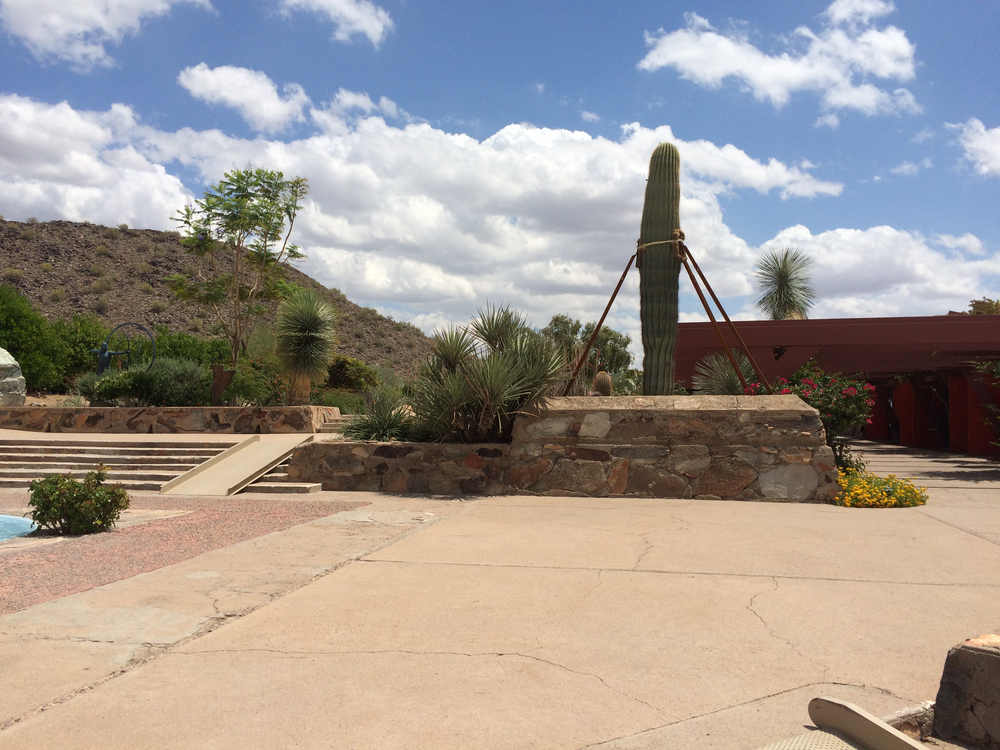

In [34]:
Image('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/panorama/scottsdale_left.png')
#Image('/content/drive/MyDrive/Slides_CV/Pratices/InClass/CV05.LocalFeature and Matching/CV05.InClass.Features and Image Matching/panorama/scottsdale_right.png')